<a href="https://colab.research.google.com/github/MattTeerapatt/ThaiFestivalAccidentPrediction/blob/main/ThaiFestivalAccidentPrediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Data Preprocessing**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Path to file in Google Drive
file_path = '/content/drive/My Drive/Data-Sci/thai_road_accident_2019_2022.csv'

# Load the CSV file into a DataFrame
import pandas as pd
df = pd.read_csv(file_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Get all column names
column_names = df.columns.tolist()

# Print column names
print(column_names)

['acc_code', 'incident_datetime', 'report_datetime', 'province_th', 'province_en', 'agency', 'route', 'vehicle_type', 'presumed_cause', 'accident_type', 'number_of_vehicles_involved', 'number_of_fatalities', 'number_of_injuries', 'weather_condition', 'latitude', 'longitude', 'road_description', 'slope_description']


In [ ]:
# Convert 'incident_datetime' to datetime format
df['incident_datetime'] = pd.to_datetime(df['incident_datetime'])

# Initialize an empty DataFrame to store filtered data
festival_accidents = pd.DataFrame()

# Loop through each year from 2019 to 2022
for year in range(2019, 2023):
    # Define the date ranges for the New Year and Songkran festivals
    new_year_start = pd.Timestamp(year=year-1, month=12, day=29)
    new_year_end = pd.Timestamp(year=year, month=1, day=4)
    songkran_start = pd.Timestamp(year=year, month=4, day=11)
    songkran_end = pd.Timestamp(year=year, month=4, day=17)

    # Filter the data for New Year and Songkran festivals
    new_year_accidents = df[(df['incident_datetime'] >= new_year_start) &
                            (df['incident_datetime'] <= new_year_end)]

    songkran_accidents = df[(df['incident_datetime'] >= songkran_start) &
                            (df['incident_datetime'] <= songkran_end)]

    # Combine the two festival datasets for the current year
    current_year_accidents = pd.concat([new_year_accidents, songkran_accidents])

    # Append the current year's data to the overall festival_accidents DataFrame
    festival_accidents = pd.concat([festival_accidents, current_year_accidents])

# Reset the index of the filtered dataset
festival_accidents.reset_index(drop=True, inplace=True)

# Handle Missing Data
df.ffill(inplace=True)

# **Exploratory Data Analysis (EDA)**

**Step 1: Basic Statistics and Summary**

Start by getting a high-level overview of the dataset.

In [ ]:
# Display the first few rows of the dataset
print(festival_accidents.head())

# Get summary statistics for numerical columns
print(festival_accidents.describe())

# Get summary of categorical columns
print(festival_accidents.describe(include=['object']))

# Check for missing values
print(festival_accidents.isnull().sum())

   acc_code   incident_datetime      report_datetime      province_th  \
0    571905 2019-01-01 00:00:00  2019-01-02 06:11:00           ลพบุรี   
1   3790870 2019-01-01 00:03:00  2020-02-20 13:48:00      อุบลราชธานี   
2    599075 2019-01-01 00:05:00  2019-01-01 10:35:00  ประจวบคีรีขันธ์   
3    571924 2019-01-01 00:20:00  2019-01-02 05:12:00        เชียงใหม่   
4    599523 2019-01-01 00:25:00  2019-01-04 09:42:00        นครสวรรค์   

           province_en                     agency  \
0               Loburi  department of rural roads   
1     Ubon Ratchathani     department of highways   
2  Prachuap Khiri Khan     department of highways   
3           Chiang Mai  department of rural roads   
4         Nakhon Sawan     department of highways   

                                               route           vehicle_type  \
0  แยกทางหลวงหมายเลข 21 (กม.ที่ 31+000) - บ้านวัง...             motorcycle   
1                              เดชอุดม - อุบลราชธานี  private/passenger car   
2    

**Step 2: Distribution of Accidents Over the Years**

Analyze how the number of accidents varies by year and festival.

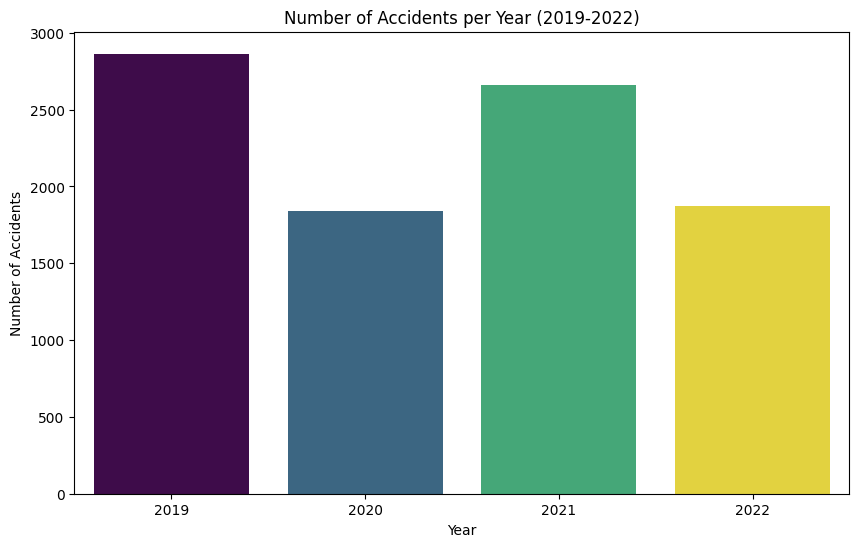

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract year from 'incident_datetime'
festival_accidents['year'] = festival_accidents['incident_datetime'].dt.year

# Count the number of accidents per year
accidents_per_year = festival_accidents['year'].value_counts().sort_index()

# Plot the number of accidents per year
plt.figure(figsize=(10, 6))
sns.barplot(x=accidents_per_year.index, y=accidents_per_year.values, hue=accidents_per_year.index, palette='viridis', legend=False)
plt.title('Number of Accidents per Year (2019-2022)')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')
plt.show()

**Step 3: Distribution by Accident Type and Cause**

Understand the most common types of accidents and their causes during the festivals.

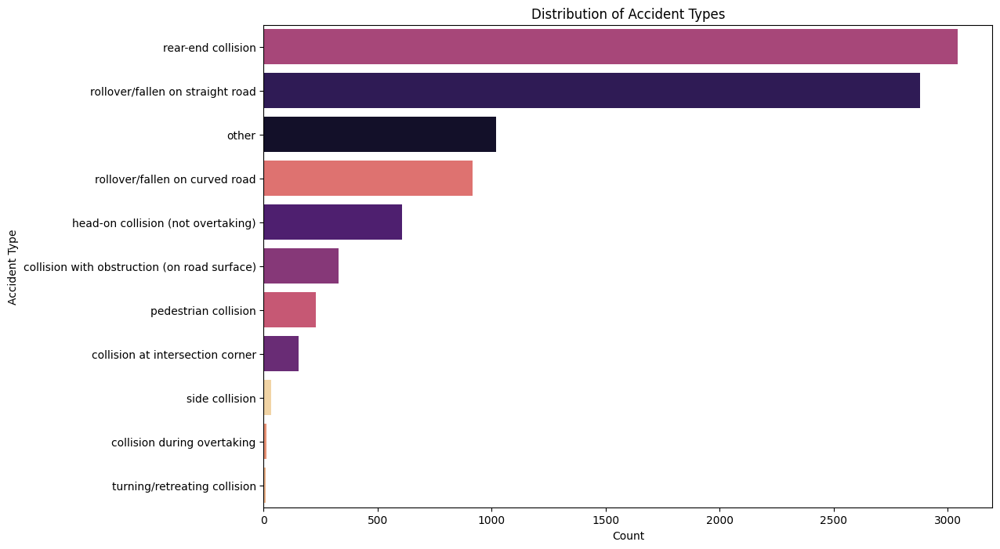

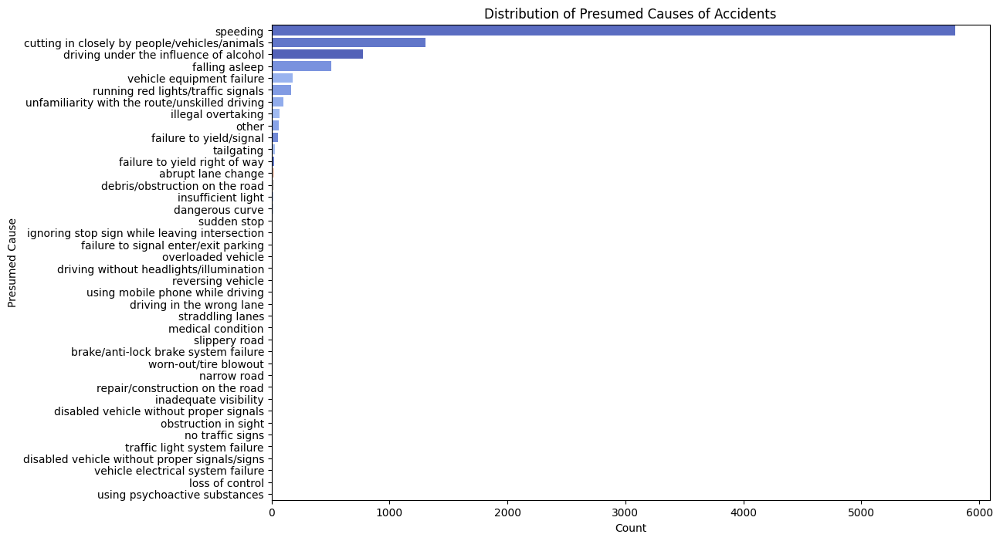

In [ ]:
# Plot the distribution of accident types
plt.figure(figsize=(12, 8))
sns.countplot(y='accident_type', data=festival_accidents, order=festival_accidents['accident_type'].value_counts().index, hue='accident_type', palette='magma', legend=False)
plt.title('Distribution of Accident Types')
plt.xlabel('Count')
plt.ylabel('Accident Type')
plt.show()

# Plot the distribution of presumed causes of accidents
plt.figure(figsize=(12, 8))
sns.countplot(y='presumed_cause', data=festival_accidents, order=festival_accidents['presumed_cause'].value_counts().index, hue='presumed_cause', palette='coolwarm', legend=False)
plt.title('Distribution of Presumed Causes of Accidents')
plt.xlabel('Count')
plt.ylabel('Presumed Cause')
plt.show()

**Step 4: Geographical Analysis**

Visualize the locations of accidents on a map.

In [ ]:
import folium
from folium.plugins import MarkerCluster

# Create a map centered around Thailand
m = folium.Map(location=[13.736717, 100.523186], zoom_start=6)

# Add a marker cluster to the map
marker_cluster = MarkerCluster().add_to(m)

# Add markers for each accident location
for idx, row in festival_accidents.iterrows():
    folium.Marker(location=[row['latitude'], row['longitude']],
                  popup=f"Type: {row['accident_type']}<br>Cause: {row['presumed_cause']}<br>Injuries: {row['number_of_injuries']}<br>Fatalities: {row['number_of_fatalities']}").add_to(marker_cluster)

# Display the map
m

**Step 5: Accidents by Time of Day**

Analyze when accidents are most likely to occur during the day.

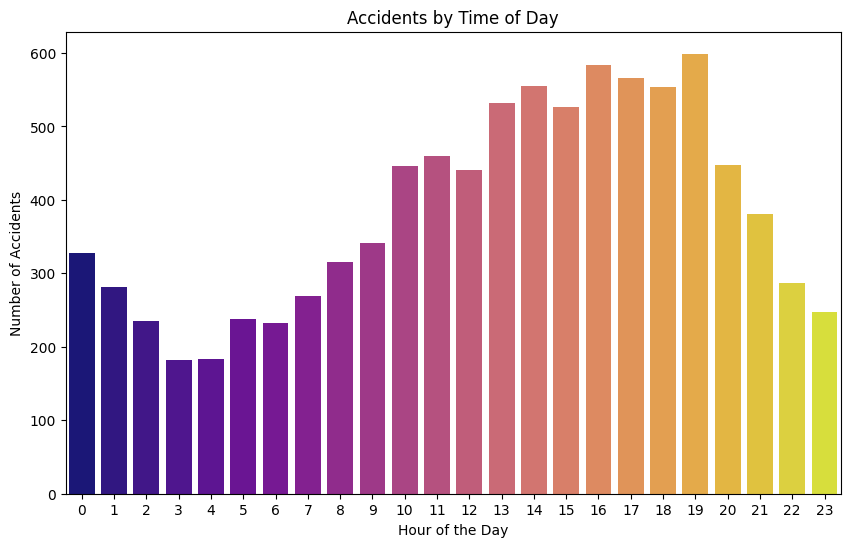

In [ ]:
# Extract hour from 'incident_datetime'
festival_accidents['hour'] = festival_accidents['incident_datetime'].dt.hour

# Plot the distribution of accidents by hour
plt.figure(figsize=(10, 6))
sns.countplot(x='hour', data=festival_accidents, hue='hour', palette='plasma', legend=False)
plt.title('Accidents by Time of Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.show()

**Step 6: Number of Vehicles Involved**

Examine the number of vehicles typically involved in accidents during these festivals.

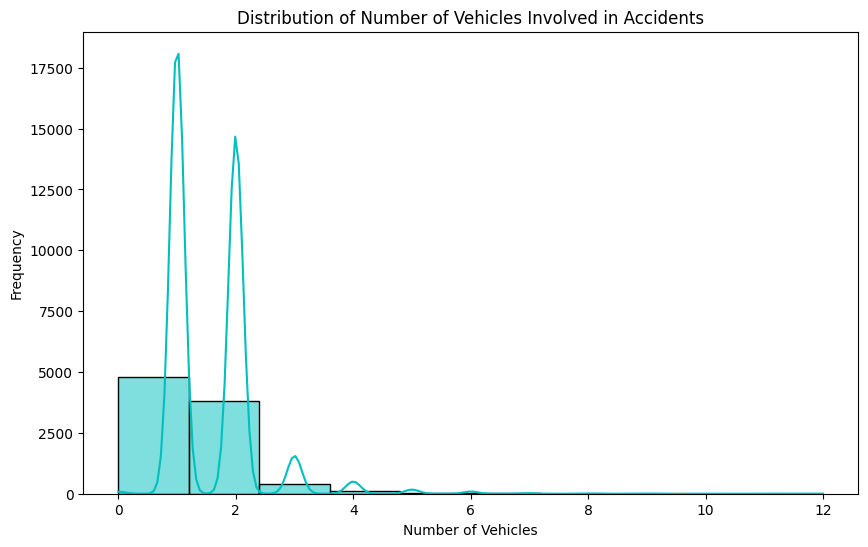

In [ ]:
# Plot the distribution of the number of vehicles involved in accidents
plt.figure(figsize=(10, 6))
sns.histplot(festival_accidents['number_of_vehicles_involved'], bins=10, kde=True, color='c')
plt.title('Distribution of Number of Vehicles Involved in Accidents')
plt.xlabel('Number of Vehicles')
plt.ylabel('Frequency')
plt.show()